In [1]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score

import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

import seaborn as sns

from IPython.core.display import HTML as Center

Center(""" <style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style> """)

In [2]:
df_full = pd.read_csv('hc_matched_new.csv')
df_full.matched.value_counts()

1.0    1380
0.0      24
Name: matched, dtype: int64

In [3]:
# Export the regulation data which arent matched
hc_not_matched = df_full.loc[df_full['matched'] == 0.0]
hc_not_matched.to_csv('hc_not_matched.csv', index = False)

In [4]:
df_full = df_full.loc[df_full['matched'] == 1.0]
df_full = df_full.reset_index(drop=True)
df_full.drop(['HC_Description','matched','score'], axis=1, inplace=True)

In [5]:
data = df_full[['FDA_Code','HC_Code']]
print(data.shape)
data.head(3)

(1380, 2)


,FDA_Code,HC_Code
0,"""56.105""",A.01.001
1,"""184.1851""",A.01.002
2,"""200.7""",A.01.010


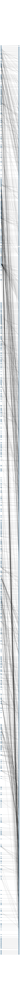

In [6]:
B = nx.Graph()
B.add_nodes_from(data['HC_Code'], bipartite=0)
B.add_nodes_from(data['FDA_Code'], bipartite=1)
B.add_weighted_edges_from(
    [(row['FDA_Code'], row['HC_Code'], 1) for idx, row in data.iterrows()], 
    weight='weight')

plt.figure(figsize=(10,500))

pos = {node:[0, i] for i,node in enumerate(data['FDA_Code'])}
pos.update({node:[1, i] for i,node in enumerate(data['HC_Code'])})
nx.draw(B, pos, with_labels=False)
for p in pos:  
    pos[p][1] += 0.25
nx.draw_networkx_labels(B, pos)

plt.show()

In [7]:
reference_df = pd.DataFrame(list(zip(df_full.FDA_Code.unique())), columns = ['FDA_Code'])
reference_df['y'] = (reference_df.index).astype(str)
print(reference_df.shape)
reference_df.head(3)

(702, 2)


,FDA_Code,y
0,"""56.105""",0
1,"""184.1851""",1
2,"""200.7""",2


In [8]:
df_full = df_full.merge(reference_df, on='FDA_Code', how='left')
df_full.drop_duplicates(subset=df_full.columns, keep='last',inplace =True)
print(df_full.shape)
df_full.head(3)

(1380, 12)


,HC_Chapter,HC_Section,HC_Subpart,HC_Code,hc_desc_cleaned,FDA_Code,FDA_Chapter,FDA_Section,FDA_Subpart,FDA_Description,fda_desc_cleaned,y
0,Administration,General,Not Available,A.01.001,regulation may cited food drug regulation,"""56.105""",GENERAL ENFORCEMENT REGULATIONS,General Provisions,Waiver of IRB requirement.,On the application of a sponsor or sponsor-inv...,application sponsor sponsorinvestigator food d...,0
1,Administration,General,Not Available,A.01.002,regulation applicable prescribe standard compo...,"""184.1851""",DIRECT FOOD SUBSTANCES AFFIRMED AS GENERALLY R...,Listing of Specific Substances Affirmed as GRAS,Stearyl citrate.,"(a) Stearyl citrate is a mixture of the mono-,...",stearyl citrate mixture mono di tristearyl est...,1
2,Administration,Interpretation,Not Available,A.01.010,regulation acceptable method act food drug act...,"""200.7""",GENERAL,General Provisions,Supplying pharmacists with indications and dos...,There are presently no regulations under the F...,presently regulation federal food drug cosmeti...,2


In [9]:
X_ref = df_full[['FDA_Chapter','FDA_Section','FDA_Subpart','HC_Chapter','HC_Section','HC_Subpart','HC_Code']]

# Categorical Features
X = df_full[['FDA_Chapter','FDA_Section','FDA_Subpart','HC_Chapter','HC_Section','HC_Subpart']]
X = pd.get_dummies(data = X_ref, columns = X_ref.columns)

# Textual Features
tfidf_vectorizer = TfidfVectorizer()
X_text = df_full[['hc_desc_cleaned','fda_desc_cleaned']]
X_ref = pd.concat([X_ref, X_text], axis=1, sort=True)
X_text['hc_desc_cleaned'] = tfidf_vectorizer.fit_transform(X_text['hc_desc_cleaned']).toarray()
X_text['fda_desc_cleaned'] = tfidf_vectorizer.fit_transform(X_text['fda_desc_cleaned']).toarray()

# X
X = pd.concat([X, X_text], axis=1, sort=True)

# y
y = df_full.y

# Train Test Split
X_ref_train, X_ref_test, y_ref_train, y_ref_test = train_test_split(X_ref, y, test_size = 0.2, random_state = 42)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print('X_train:',X_train.shape)
print('y_train:', y_train.shape)
print('X_test:',X_test.shape)
print('y_test:',y_test.shape)

print('X_ref_train:',X_ref_train.shape)
print('y_ref_train:',y_ref_train.shape)
print('X_ref_test:',X_ref_test.shape)
print('y_ref_test:',y_ref_test.shape)

X_train: (1104, 2783)
y_train: (1104,)
X_test: (276, 2783)
y_test: (276,)
X_ref_train: (1104, 9)
y_ref_train: (1104,)
X_ref_test: (276, 9)
y_ref_test: (276,)


In [10]:
print('---------- Logistic Regression ----------')
lr = LogisticRegression(multi_class='ovr')
lr.fit(X_train, y_train)
lr_predictions = lr.predict(X_test)

lr_f1 = metrics.f1_score(y_test, lr_predictions, average = 'micro') 
print('F1 Score:',round(lr_f1,4))

lr_ck = cohen_kappa_score(y_test, lr_predictions)
print('Cohen Kappa Score:',round(lr_ck,4))

lr_hamm_loss = metrics.hamming_loss(y_test, lr_predictions)
print('Hamming Loss:', round(lr_hamm_loss,4))

print('---------- Random Forest Classifier ----------')
rf = RandomForestClassifier(n_estimators = 100, random_state=42).fit(X_train, y_train) 
rf_predictions = rf.predict(X_test) 

rf_f1 = metrics.f1_score(y_test, rf_predictions, average = 'micro') 
print('F1 Score:',round(rf_f1,4))

rf_ck = cohen_kappa_score(y_test, rf_predictions)
print('Cohen Kappa Score:',round(rf_ck,4))

rf_hamm_loss = metrics.hamming_loss(y_test, rf_predictions)
print('Hamming Loss:', round(rf_hamm_loss,4))

---------- Logistic Regression ----------
F1 Score: 0.5
Cohen Kappa Score: 0.4963
Hamming Loss: 0.5
---------- Random Forest Classifier ----------
F1 Score: 0.587
Cohen Kappa Score: 0.5843
Hamming Loss: 0.413


In [11]:
# tabulating predictions and corresponding predicted Health Canada Code
predictions = pd.DataFrame(rf_predictions)
predictions.rename(columns = {0:'y_Predicted'}, inplace = True) 
predictions = predictions.merge(reference_df, left_on='y_Predicted', right_on='y', how='left').rename(columns={'FDA_Code':'FDA_Code_Predicted'})
predictions.drop(['y'], axis=1,inplace=True)
predictions

,y_Predicted,FDA_Code_Predicted
0,204,"""155.190"""
1,275,"""570.14"""
2,542,"""606.140"""
3,186,"""184.1555"""
4,244,"""582.3862"""
...,...,...
271,669,"""1313.34"""
272,521,"""520.2345h"""
273,348,"""310.306"""
274,173,"""133.175"""


In [12]:
# adding the prediction to test set
prediction_results = X_ref_test.copy()
prediction_results.reset_index(drop=True,inplace=True)
prediction_results = prediction_results.merge(predictions, left_index=True, right_index=True)
print(prediction_results.shape)
prediction_results.head(3)

(276, 11)


,FDA_Chapter,FDA_Section,FDA_Subpart,HC_Chapter,HC_Section,HC_Subpart,HC_Code,hc_desc_cleaned,fda_desc_cleaned,y_Predicted,FDA_Code_Predicted
0,CANNED VEGETABLES,Requirements for Specific Standardized Canned ...,Canned tomatoes.,Foods,"Fruits, Vegetables, Their Products and Substit...",Vegetables,B.11.009,tomato paste determination tomato solid,identity description canned tomato food prepar...,204,"""155.190"""
1,FOOD ADDITIVES,General Provisions,Indirect food additives resulting from packagi...,Foods,Marine and Fresh Water Animal Products,Not Available,B.21.001,food referred division included term marine fr...,regulation providing use food packaging materi...,275,"""570.14"""
2,CURRENT GOOD MANUFACTURING PRACTICE FOR BLOOD ...,Laboratory Controls,Laboratory controls.,Drugs,Good Manufacturing Practices,Preparations from Human Sources,C.04.231,fabricator shall obtain human serum human plas...,laboratory control procedure shall include est...,542,"""606.140"""


In [13]:
prediction_results.drop(['y_Predicted'],axis=1,inplace=True)

In [14]:
prediction_results.to_csv('predicted_FDACodes.csv',index=False)

### Cross check against SME's test values

In [15]:
result1 = prediction_results.loc[prediction_results['HC_Code'] == 'C.02.005']
result1.drop(['hc_desc_cleaned','fda_desc_cleaned'], axis=1, inplace=True)
result1

,FDA_Chapter,FDA_Section,FDA_Subpart,HC_Chapter,HC_Section,HC_Subpart,HC_Code,FDA_Code_Predicted
57,CURRENT GOOD MANUFACTURING PRACTICE FOR FINISH...,Records and Reports,Production record review.,Drugs,Good Manufacturing Practices,Equipment,C.02.005,"""211.184"""


In [16]:
result2 = prediction_results.loc[prediction_results['HC_Code'] == 'C.02.006']
result2.drop(['hc_desc_cleaned','fda_desc_cleaned'], axis=1, inplace=True)
result2

,FDA_Chapter,FDA_Section,FDA_Subpart,HC_Chapter,HC_Section,HC_Subpart,HC_Code,FDA_Code_Predicted
70,PRESCRIPTION DRUG MARKETING,Samples,Drug sample storage and handling requirements.,Drugs,Good Manufacturing Practices,Personnel,C.02.006,"""203.32"""


In [17]:
result3 = prediction_results.loc[prediction_results['HC_Code'] == 'C.02.007']
result3.drop(['hc_desc_cleaned','fda_desc_cleaned'], axis=1, inplace=True)
result3

,FDA_Chapter,FDA_Section,FDA_Subpart,HC_Chapter,HC_Section,HC_Subpart,HC_Code,FDA_Code_Predicted
24,CURRENT GOOD MANUFACTURING PRACTICE FOR FINISH...,Buildings and Facilities,Sanitation.,Drugs,Good Manufacturing Practices,Sanitation,C.02.007,"""211.28"""
